## 설치

튜토리얼 실습을 위해 필요한 라이브러리를 설치 합니다.

### 1. 환경설정

In [ ]:
# 레포지토리 클론
git clone https://github.com/Seonghoon-Yu/Pseudo-RIS

# 레포지토리로 이동
cd Pseudo-RIS

# 가상환경 생성 및 활성화 (conda가 설치되어 있어야 합니다)
conda create -n pseudo_ris python=3.9
conda activate pseudo_ris

# 필수 패키지 설치
conda install pytorch==1.11.0 torchvision==0.12.0 torchaudio==0.11.0 cudatoolkit=11.3 -c pytorch
pip install pydantic
conda install -c conda-forge spacy
python -m spacy download en_core_web_lg
pip install opencv-python
pip install transformers==4.31
pip install lmdb
pip install pyarrow==11.0.0
pip install colored
pip install pycocotools
pip install pandas
pip install pillow==9.5.0

### 2. 외부 모델 설치

In [ ]:
# CoCa (이미지 캡셔닝 모델) 설치
cd third_party/open_clip
pip install -e .
cd ..

# CutLER (비지도 이미지 분할 모델) 를 위한 detectron2 설치 
cd detectron2
pip install -e .
cd ..

# CLIP (이미지-텍스트 정렬 모델) 설치
cd CLIP
pip install -e .
cd ..

# SAM (이미지 분할 모델) 설치
cd segment-anything
pip install -e .

### 3. 외부 모델의 사전 학습 가중치 다운로드

In [ ]:
# SAM (Segment Anything Model) 가중치 다운로드
cd third_party/segment-anything/segment_anything
mkdir checkpoints
cd checkpoints
wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

# CutLER (Unsupervised Object Segmentation Model) 가중치 다운로드
cd third_party/CuTLER/cutler/
mkdir checkpoints
cd checkpoints
wget http://dl.fbaipublicfiles.com/cutler/checkpoints/cutler_cascade_final.pth

## 예시 이미지

Text(0.5, 1.0, 'Example Image')

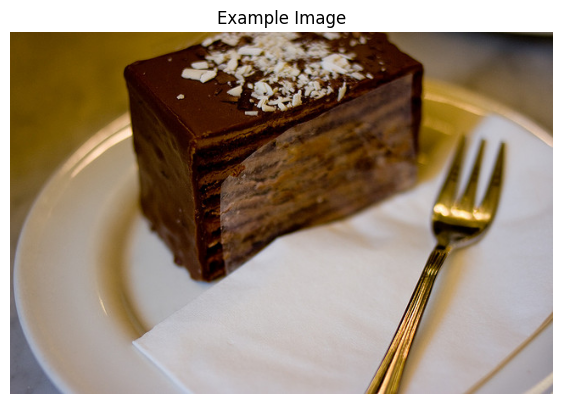

In [106]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

path2dir = './example_images' # 예시 이미지가 저장된 디렉토리
img_name = 'COCO_train2014_000000000092.jpg' # 예시 이미지 파일 이름
path2img = os.path.join(path2dir, img_name) # 예시 이미지의 경로
image = Image.open(path2img) # 예시 이미지 불러오기

# 예시 이미지 출력
plt.figure(figsize=(7, 7))
plt.imshow(image)
plt.axis('off')
plt.title('Example Image')

## 가짜 마스크 (pseudo mask) 생성

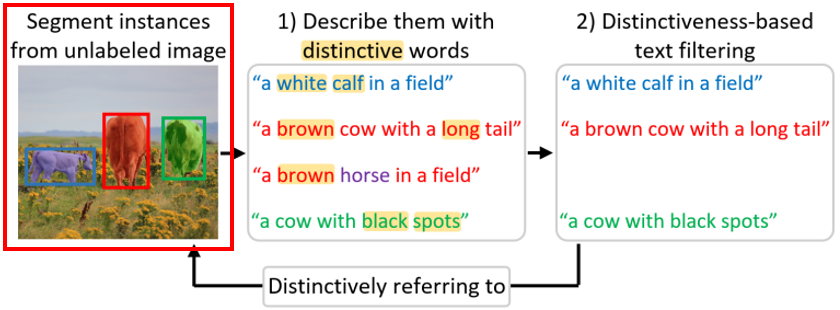

가짜 마스크 (pseudo mask) 생성을 위해 다음 두 가지 모델을 결합하여 사용합니다:
1. SAM (초거대 분할 모델)
    - 클래스에 구애받지 않는 (class-agnoistic) 마스크를 이미지에서 추출합니다.


2. CutLER (비지도 객체 분할 모델)
    - 객체단위 분할 마스크를 생성합니다.

두 모델이 생성한 마스크의 교집합 영역만을 선별하여, 이를 pseudo-supervision의 mask로 활용합니다.



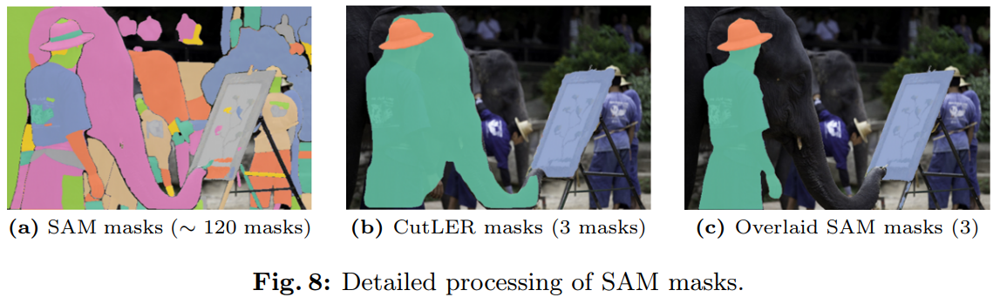

In [107]:
# 마스크 시각화 코드
import numpy as np
import matplotlib.pyplot as plt
import torch
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)

def show_masks(anns):
    if type(anns) ==  torch.Tensor:
        if len(anns.shape) == 2:
            anns = anns.unsqueeze(0)
        anns = anns.cpu().numpy() # Tensor를 cpu로 옮기고 numpy로 변환
    else:
        anns = anns[None,:,:]
    if len(anns) == 0:
        return

    h,w = anns.shape[-2:]
    
    ax = plt.gca() # 현재의 axis 가져오기
    ax.set_autoscale_on(False)

    # sorted_anns = sorted(anns, key=lambda x: -np.sum(x)) # mask size 오름차순으로 정렬

    img = np.ones((h, w, 4)) # 빈 이미지 생성
    img[:,:,3] = 0
    for ann in anns:
        color_mask = np.concatenate([np.random.random(3), [0.6]]) # 마스크 랜덤 색상 지정 및 투명도 설명
        img[ann] = color_mask # 빈 이미지에 마스크 그려넣기
    ax.imshow(img)

### 1. SAM Mask 추출 및 시각화

In [108]:
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
import cv2

sam_image = cv2.imread(path2img)  # SAM 모델에 입력할 이미지 불러오기
sam_image = cv2.cvtColor(sam_image, cv2.COLOR_BGR2RGB)  # OpenCV는 BGR로 이미지를 읽으므로 RGB로 변환

sam = sam_model_registry["vit_h"](checkpoint="./third_party/segment-anything/segment_anything/checkpoints/sam_vit_h_4b8939.pth").to(device="cuda") # SAM 모델 불러오기
mask_generator = SamAutomaticMaskGenerator(sam, pred_iou_thresh=0.5)
sam_masks = mask_generator.generate(sam_image)  # SAM 모델을 사용하여 마스크 생성

print(len(sam_masks), "masks generated")  # 생성된 마스크 개수 출력

49 masks generated


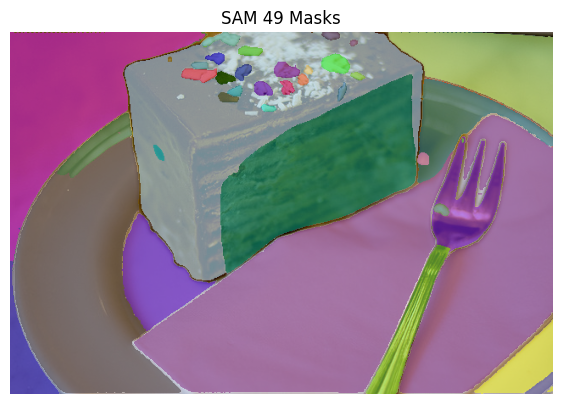

In [109]:
# 마스크 시각화
sam_masks = [torch.tensor(mask['segmentation']) for mask in sam_masks]
sam_masks = torch.stack(sam_masks)
plt.figure(figsize=(7, 7))
plt.imshow(image)  # 원본 이미지 출력
show_masks(sam_masks)
plt.axis('off')
plt.title(f'SAM {len(sam_masks)} Masks')
plt.show()

### 2. CutLER Mask 추출 및 시각화

In [110]:
from detectron2.config import get_cfg
from detectron2.checkpoint import DetectionCheckpointer
import argparse
import sys
sys.path.append('./third_party/CutLER/cutler')
from modeling import build_model
from config import add_cutler_config
import data.transforms as T

### CutLER 모델 설정을 위한 함수
def setup_cfg(args):
    # load config from file and command-line arguments
    cfg = get_cfg()
    add_cutler_config(cfg)
    cfg.merge_from_file(args.config_file)
    cfg.merge_from_list(args.opts)
    # Disable the use of SyncBN normalization when running on a CPU
    # SyncBN is not supported on CPU and can cause errors, so we switch to BN instead
    if cfg.MODEL.DEVICE == 'cpu' and cfg.MODEL.RESNETS.NORM == 'SyncBN':
        cfg.MODEL.RESNETS.NORM = "BN"
        cfg.MODEL.FPN.NORM = "BN"
    # Set score_threshold for builtin models
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = args.confidence_threshold
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = args.confidence_threshold
    cfg.MODEL.PANOPTIC_FPN.COMBINE.INSTANCES_CONFIDENCE_THRESH = args.confidence_threshold
    cfg.freeze()
    return cfg

def get_parser():
    parser = argparse.ArgumentParser(description="Detectron2 demo for builtin configs")
    parser.add_argument(
        "--config-file",
        default="third_party/CutLER/cutler/model_zoo/configs/CutLER-ImageNet/cascade_mask_rcnn_R_50_FPN.yaml",
        metavar="FILE",
        help="path to config file",
    )
    parser.add_argument("--webcam", action="store_true", help="Take inputs from webcam.")
    parser.add_argument("--video-input", help="Path to video file.")
    parser.add_argument(
        "--input",
        nargs="+",
        help="A list of space separated input images; "
        "or a single glob pattern such as 'directory/*.jpg'",
    )
    parser.add_argument(
        "--output",
        help="A file or directory to save output visualizations. "
        "If not given, will show output in an OpenCV window.",
    )

    parser.add_argument(
        "--confidence-threshold",
        type=float,
        default=0.5,
        help="Minimum score for instance predictions to be shown",
    )
    parser.add_argument(
        "--opts",
        help="Modify config options using the command-line 'KEY VALUE' pairs",
        default=[],
        nargs=argparse.REMAINDER,
    )
    return parser

# CutLER 모델 설정
args = get_parser().parse_args([])
cfg = setup_cfg(args)

In [111]:
# CutLER 모델 불러오기
cutler = build_model(cfg).to(device="cuda")
cutler.eval()

# CutLER 모델 가중치 불러오기
path2weights = "./third_party/CutLER/cutler/checkpoints/cutler_cascade_final.pth"
checkpointer = DetectionCheckpointer(cutler)
checkpointer.load(path2weights)

# CutLER 모델에 입력할 이미지 전처리 함수수
aug = T.ResizeShortestEdge(
    [cfg.INPUT.MIN_SIZE_TEST, cfg.INPUT.MIN_SIZE_TEST], cfg.INPUT.MAX_SIZE_TEST
    )

height, width = sam_image.shape[:2]
cutler_image = aug.get_transform(sam_image).apply_image(sam_image) # CutLER 모델에 입력할 이미지 전처리
cutler_image = torch.as_tensor(cutler_image.astype("float32").transpose(2, 0, 1))
cutler_input = {"image": cutler_image, "height": height, "width": width}

with torch.no_grad():
    cutler_output = cutler([cutler_input])[0]  # CutLER 모델에 입력 이미지 전달 및 출력 받기

cutler_masks = cutler_output['instances'].pred_masks
print(len(cutler_masks), "masks generated")  # 생성된 마스크 개수 출력

2 masks generated


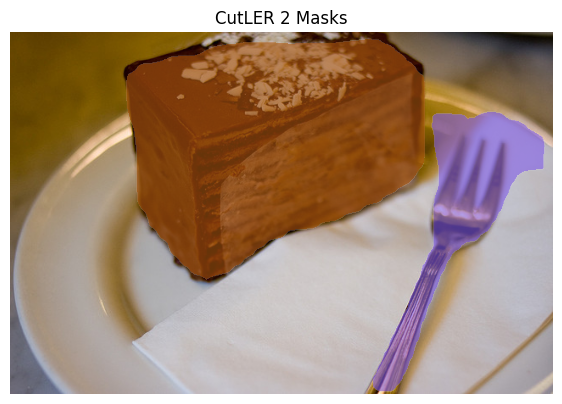

In [112]:
# CutLER 마스크 시각화
plt.figure(figsize=(7, 7))
plt.imshow(image)  # 원본 이미지 출력
show_masks(cutler_masks)
plt.axis('off')
plt.title(f'CutLER {len(cutler_masks)} Masks')
plt.show()


In [113]:
# CutLER 마스크와 중첩된 SAM 마스크 얻기
N_c, H, W = cutler_masks.shape
N_s = sam_masks.shape[0]

inter = cutler_masks.to('cpu').unsqueeze(1) & sam_masks.to('cpu').unsqueeze(0)  # CutLER 마스크와 SAM 마스크의 교집합 계산
overlaps = inter.view(N_c, N_s, -1).sum(dim=2)  # 교집합의 픽셀 수 계산
max_overlaps, max_overlap_idx = overlaps.max(dim=1)  # 각 CutLER 마스크에 대해 가장 큰 SAM 마스크의 교집합 픽셀 수와 인덱스 찾기
final_masks = sam_masks[max_overlap_idx].to("cuda")  # 최종 마스크 선택

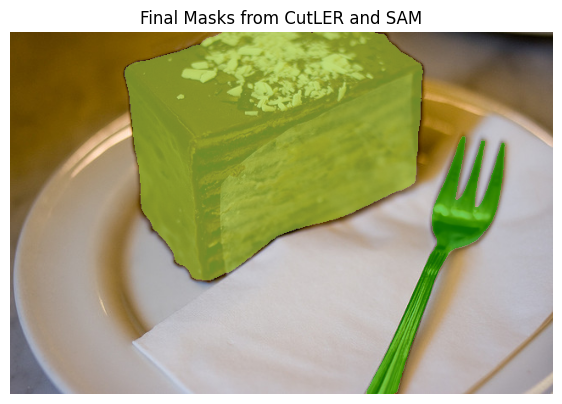

In [114]:
# CutLER 마스크와 중첩된 SAM 마스크 시각화
plt.figure(figsize=(7, 7))
plt.imshow(image)  # 원본 이미지 출력
show_masks(final_masks)
plt.axis('off')
plt.title(f'Final Masks from CutLER and SAM')
plt.show()


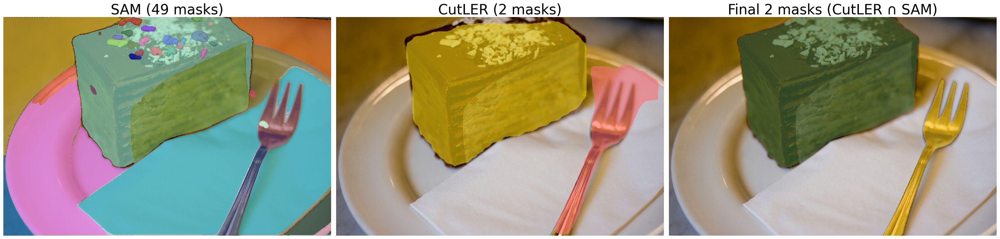

In [115]:
# SAM, CutLER, 최종 마스크 시각화
fig, axes = plt.subplots(1, 3, figsize=(30, 10))
titles = [
    f"SAM ({len(sam_masks)} masks)",
    f"CutLER ({len(cutler_masks)} masks)",
    f"Final {len(cutler_masks)} masks (CutLER ∩ SAM)"
]
masks_list = [sam_masks, cutler_masks, final_masks]

for ax, masks, title in zip(axes, masks_list, titles):
    ax.imshow(image)        # 원본
    plt.sca(ax)             # show_masks가 현재 축에 그리도록 설정
    show_masks(masks)       # 마스크 오버레이
    ax.axis('off')
    ax.set_title(title, fontsize=30)

plt.tight_layout()
plt.show()

## Pseudo Text 생성
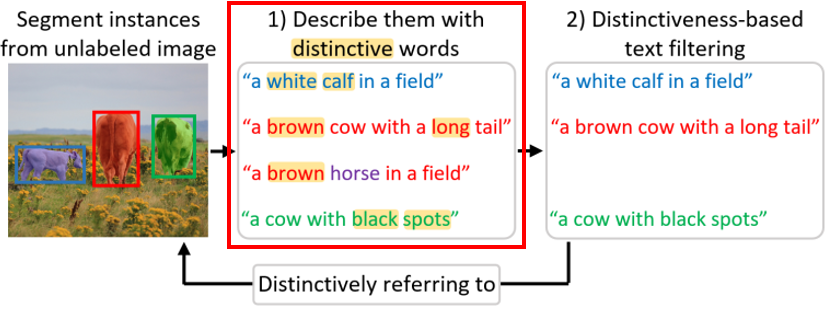

추출한 pseudo masks 를 활용하여 각 mask에 해당하는 text description을 생성합니다.

이를 위하여 CoCa (초거대 이미지 캡셔닝 모델) 을 활용합니다.

사람의 supervision을 최소화하는 연구이기 때문에, web-crawled image-text dataset 으로만 학습된 CoCa 모델을 사용했습니다.


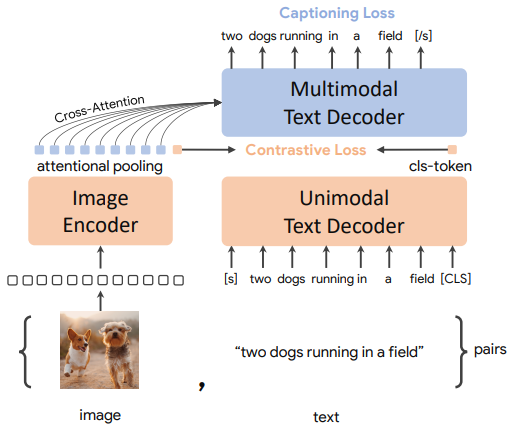

제안한 방법인 distinctive caption sampling 방법을 이용하여 텍스트를 생성합니다.

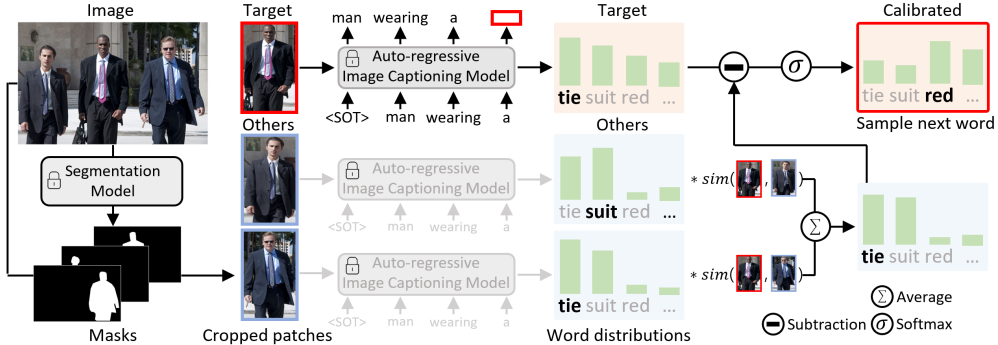




In [116]:
import open_clip

# CoCa (이미지 캡셔닝 모델) 불러오기 ()
coca, _, coca_transform = open_clip.create_model_and_transforms(
    model_name='coca_ViT-L-14',
    pretrained='./third_party/open_clip/src/open_clip/checkpoints/epoch_1.pt'
)
coca = coca.to(device="cuda")

In [117]:
# CoCa 모델에 입력할 이미지 전처리
mean = torch.tensor([0.48145466, 0.4578275,0.40821073], device='cuda').reshape(1, 3, 1, 1)
std = torch.tensor([0.26862954, 0.26130258,0.27577711], device='cuda').reshape(1, 3, 1, 1)
coca_image = torch.from_numpy(sam_image.transpose(2, 0, 1).copy()).to(device="cuda").unsqueeze(0).float()
coca_image.div_(255.0).sub_(mean).div_(std)  # 이미지 정규화
image_h, image_w = coca_image.shape[2:]

### 마스크 영역에 맞게 잘린 이미지 만들기

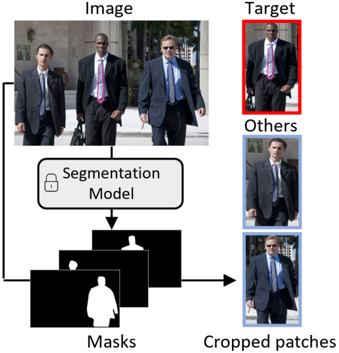

논문에서는 다양한 맥락을 지닌 text description을 생성하기 위하여 4가지 crop offset을 두고 하나의 마스크 당 총 4개의 잘린 이미지를 만들었습니다.

튜토리얼에서는 마스크 당 한 가지 잘린 이미지를 만들어서 실습하겠습니다.


In [118]:
import torchvision.transforms.functional as TF
from torchvision.ops import masks_to_boxes

final_boxes = masks_to_boxes(final_masks)
cropped_imgs = []


for i, (m, b) in enumerate(zip(final_masks, final_boxes)):
    # 마스크 영역을 기준으로 이미지 자르기
    x_min, y_min, x_max, y_max = [_.item() for _ in b]
    w, h = (x_max - x_min), (y_max - y_min)
    x_margin, y_margin = (w - (x_max - x_min)) / 2, (h - (y_max - y_min)) / 2
    x_min, y_min, x_max, y_max = max(0, x_min - x_margin), max(0, y_min - y_margin), min(image_w, x_max + x_margin), min(image_h, y_max + y_margin)
    cropped_img = TF.crop(coca_image.squeeze(0), int(y_min), int(x_min), int(h), int(w)).unsqueeze(0)
    
    # 잘린 이미지 padding
    max_wh = int(max(w, h))
    pad_left = (max_wh - cropped_img.shape[3]) // 2
    pad_top = (max_wh - cropped_img.shape[2]) // 2
    pad_right = max_wh - cropped_img.shape[3] - pad_left
    pad_bottom = max_wh - cropped_img.shape[2] - pad_top
    padded_img = TF.pad(cropped_img, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    dummy_image = torch.ones((cropped_img.shape)).to(device="cuda")
    padded_dummy = TF.pad(dummy_image, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    padded_img = padded_img + (1 - padded_dummy) * 0.48145466
    
    # padding된 이미지를 224x224로 크기 변경
    resized_img = TF.resize(padded_img, (224, 224), antialias=True)
    cropped_imgs.append(resized_img)

cropped_imgs = torch.cat(cropped_imgs, dim=0).to(device="cuda") # [N, 3, 224, 224]
    

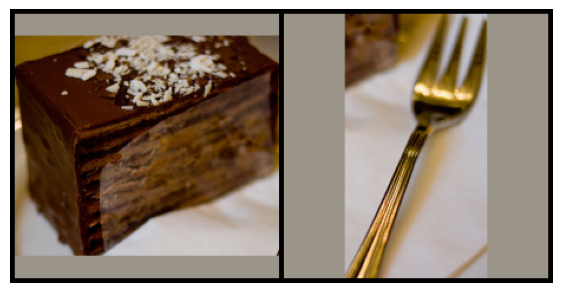

In [119]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# 잘린 이미지 시각화
vis_cropped_imgs = cropped_imgs.cpu() * std.cpu() + mean.cpu()  # 정규화된 이미지 복원
grid = vutils.make_grid(vis_cropped_imgs, nrow=8, padding=4)
grid = grid.numpy().transpose((1, 2, 0))

plt.figure(figsize=(7, 7))
plt.imshow(grid)
plt.axis('off')
plt.show()

### 잘린 이미지 (cropped patches) 에 대한 가짜 텍스트(pseudo text) 생성

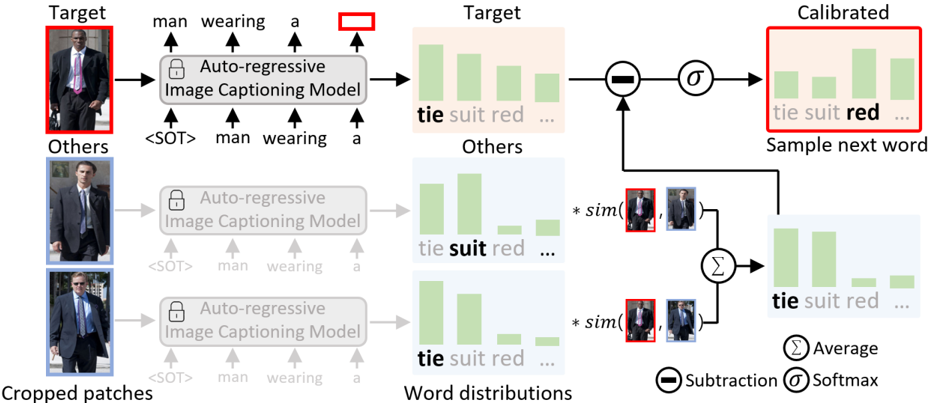

우선 텍스트 생성을 위한 설정을 정의합니다.

본 논문에서는 Top-k, Top-p 등 여러 하이퍼파라미터 조합을 활용해 다양한 텍스트를 생성합니다.

In [120]:
from collections import defaultdict
from transformers import (
    BeamSearchScorer,
    LogitsProcessorList,
    TopPLogitsWarper,
    TopKLogitsWarper,
    # TotalLogitsWarper,
    RepetitionPenaltyLogitsProcessor,
    MinLengthLogitsProcessor,
    MaxLengthCriteria,
    StoppingCriteriaList,
)
from third_party.open_clip.src.open_clip.coca_model import DependentTotalLogitsWarper
from torch.nn import functional as F

### Text Generation 설정
pseudo_captions = defaultdict(list)  # 생성된 텍스트를 저장할 딕셔너리
sot_token_id = 49406  # SOT (Start of Text) 토큰 ID
eos_token_id = 49407  # EOS (End of Text) 토큰 ID
pad_token_id = 0  # PAD (Padding) 토큰 ID
max_seq_len = 77
num_images = cropped_imgs.shape[0]  # 잘린 이미지의 개수

top_k = [5, 7, 9, 11, 13] # top-k 샘플링을 위한 k 값
top_p = [0.4, 0.5, 0.6, 0.7, 0.8] # top-p 샘플링을 위한 확률 임계값
logit_warpper = DependentTotalLogitsWarper(top_k, top_p, num_images)
top_k_p_len = len(top_k) + len(top_p)

logit_processor = LogitsProcessorList(
    [
        MinLengthLogitsProcessor(5, eos_token_id),  # 최소 길이 5로 설정
        RepetitionPenaltyLogitsProcessor(1.0),  # 반복 패널티 1.0
    ]
)
stopping_criteria = StoppingCriteriaList([MaxLengthCriteria(max_length=30)])  # 최대 길이 30으로 설정

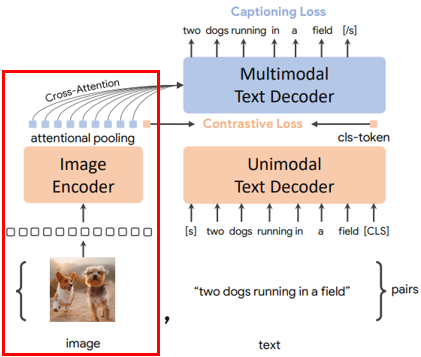

텍스트 생성에 필요한 Image embedding을 추출하기 위해 이미지를 CoCa 모델의 Image encoder에 전달합니다.

In [121]:

image_latent, image_embs = coca._encode_image(cropped_imgs) # CoCa 모델을 사용하여 이미지 인코딩
similarity_matrix = torch.mm(image_latent, image_latent.T) # 이미지 잠재 벡터 간의 유사도 행렬 계산
repeated_image_embs = image_embs.repeat(top_k_p_len, 1, 1) # top-k와 top-p의 개수만큼 이미지 임베딩 반복

text = torch.ones((image_latent.shape[0] * top_k_p_len, 1), dtype=torch.long, device="cuda") * sot_token_id  # SOT 토큰으로 초기화

cur_len = text.shape[1]  # 현재 텍스트 길이
out = text


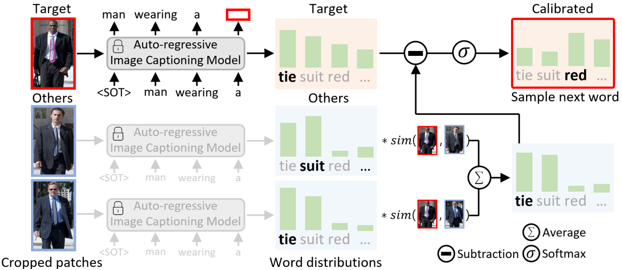

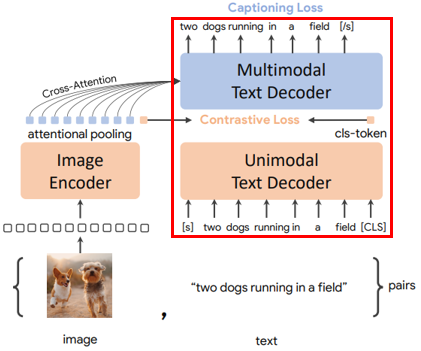

\<Start of token\> 부터 시작해서 한 단어씩 차례대로 생성합니다.

각 단어를 샘플링할때, 논문에서 제안한 distinctive caption sampling 을 활용합니다. 

\<End of token\> 등장 또는 최대 길이에 도달하면 텍스트 생성을 중지합니다.


In [122]:
with torch.no_grad():
    while True:
        # 매 이터레이션 마다 이전까지 생성된 문장을 보고 next word 샘플링
        # 종료 조건 만족시 종료
        mask = (out[:, -1] == eos_token_id) | (out[:, -1] == pad_token_id)  # 종료된 캡션 확인
        mask = mask.to(torch.bool)
        x = out[~mask, -max_seq_len:] # 종료된 캡션 제외
        cur_len = x.shape[1]  # 현재 텍스트 길이 업데이트
        text_latent, token_embs = coca._encode_text(x, embed_cls=False) # 텍스트 인코딩
        target_logits = coca.text_decoder(repeated_image_embs[~mask], token_embs)[:, -1]
        sample = torch.ones((out.shape[0], 1), device="cuda", dtype=torch.long) * pad_token_id  # 샘플링을 위한 초기화
        
        if mask.all(): # 모든 캡션이 생성 완료된 경우 종료
            break
        else:
            target_logits = logit_processor(x, target_logits) # 최소 길이, 반복 패널티 적용
            target_logits, indices_to_remove_list = logit_warpper(x, target_logits, mask) # top-p, top-k 샘플링 적용

        target_probs = F.softmax(target_logits, dim=-1)  # 확률 계산
        target_probs_eot = target_probs[:, eos_token_id]  # EOS 토큰 확률
        original_probs = target_probs.clone()  # 원본 확률 복사
        
        non_zero_idx = torch.nonzero(~mask, as_tuple=True)[0] % num_images # 종료되지 않은 캡션의 인덱스
        distinctive_image_embs = [image_embs[torch.arange(num_images) != int(idx)] for idx in non_zero_idx]  # 종료되지 않은 캡션의 이미지 임베딩
        distinctive_image_embs = torch.cat(distinctive_image_embs, dim=0)  # 리스트를 텐서로 변환
        distinctive_sim = [similarity_matrix[torch.arange(num_images) == int(idx), torch.arange(num_images) != int(idx)] for idx in non_zero_idx]  # 종료되지 않은 캡션의 이미지 임베딩
        distinctive_sim = torch.stack(distinctive_sim, dim=0) # 리스트를 텐서로 변환
        
        distinctive_token_embs = torch.cat([embs.repeat(num_images-1, 1, 1) for embs in token_embs]) # 타켓 이미지에 대해 생성된 문장의 토큰 임베딩
        distinctive_logits = coca.text_decoder(
            distinctive_image_embs, distinctive_token_embs
        )[:, -1]  # 타겟 이미지에 대해 생성된 문장과 다른 이미지를 보고 다음 단어 옟측
        distinctive_logits = distinctive_logits.view(-1, num_images-1, 49408)  # logits를 (batch_size, num_images-1, vocab_size) 형태로 변환
        distinctive_logits = distinctive_logits.mul_(distinctive_sim.unsqueeze(-1))  # 유사도 행렬을 logits에 곱하여 가중치 적용
        distinctive_logits = torch.mean(distinctive_logits, dim=1)  # 이미지 간의 평균 logits 계산
        
        target_logits = target_logits - distinctive_logits  # 타겟 logits에서 다른 이미지의 logits를 빼기

        target_logits = target_logits.masked_fill(indices_to_remove_list, -float('inf'))  # Top-k, top-p 샘플링을 위한 마스킹 적용
        target_probs = F.softmax(target_logits, dim=-1)  # softmax를 적용하여 확률 계산
        target_probs[:, eos_token_id] = target_probs_eot  # EOS 토큰 확률을 원래 확률로 설정
        
        if (cur_len + 1 == max_seq_len): # 현재 길이가 최대 길이와 같으면 EOS 토큰으로 설정
            sample[~mask, :] = torch.ones((sum(~mask), 1), device="cuda", dtype=torch.long) * eos_token_id
        else:
            sample[~mask, :] = torch.multinomial(target_probs, num_samples=1) # 샘플링하여 다음 토큰 선택
        out = torch.cat((out,sample), dim=1)  # 현재 텍스트에 샘플링된 토큰 추가
        
        cur_len += 1  # 현재 텍스트 길이 업데이트
        
        if stopping_criteria(out, None):
            break

for idx in range(out.shape[0]):
    pseudo_caption = open_clip.decode(out[idx]).split("<end_of_text>")[0].replace("<start_of_text>", "")  # EOS 토큰 제거
    pseudo_captions[idx % num_images].append(pseudo_caption)  # 캡션을 딕셔너리에 저장

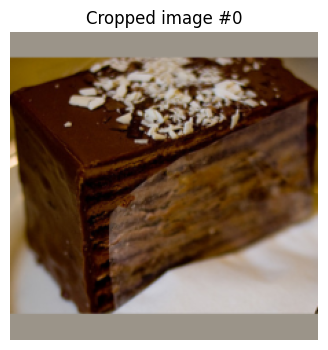

[0] chocolate mud cake at the hotel 
[1] chocolate mud cake from a recipe i used 
[2] chocolate mud cake , by business on photo sharing . 
[3] chocolate mousse cake is one of many recipes that can also make for an amazing treat for a christmas gift ! 
[4] chocolate layer square cake topped coconut 
[5] chocolate cake from the cruise 
[6] chocolate cake from the cruise ship 
[7] chocolate cake at a party 
[8] recipe of the week - gluten free mud cake 
[9] log cake is baked , every side views ! 


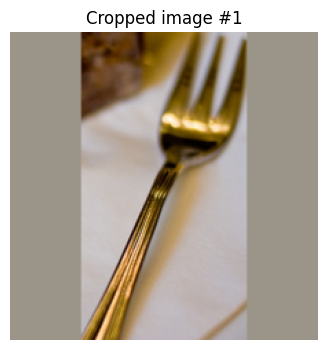

[0] gold forks at a vintage wedding reception in hotel , by wedding photographer 
[1] gold cutlery at our reception for the bride to wear 
[2] fork with shiny fork in gold on a paper white dinner table setting 
[3] fork with gold detail . a golden fork is an everyday metal piece in any setting and any other style that 's always going well at an antique - 
[4] gold forks set for breakfast on an empty table with napkin , copy space 
[5] gold fork at the dinner 
[6] gold cutlery for a wedding 
[7] gold cutlery on a white napkin 
[8] cutlery , fork on a white napkin 
[9] gold dinner forks photographed during a wedding . 


In [123]:
import matplotlib.pyplot as plt

# idx = 0 # 시각화할 이미지 인덱스

for idx in range(len(pseudo_captions)):
    img_tensor = cropped_imgs[idx:idx+1]  # shape [1,C,H,W]
    vis_img = (img_tensor.cpu() * std.cpu() + mean.cpu()).squeeze(0)  # [C,H,W]
    vis_img = vis_img.permute(1, 2, 0).clamp(0, 1).numpy()            # [H,W,C]

    plt.figure(figsize=(4, 4))
    plt.imshow(vis_img)
    plt.axis('off')
    plt.title(f"Cropped image #{idx}")
    plt.show()

    caps = pseudo_captions[idx]
    for j, cap in enumerate(caps):
        print(f"[{j}] {cap}")


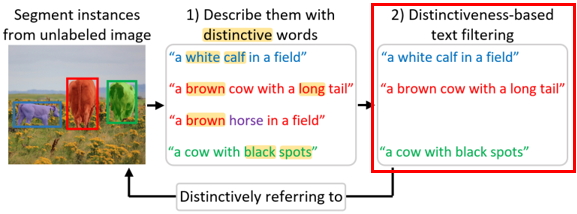

제안한 Distinctiveness Metric을 활용하여 생성된 캡션을 필터링합니다.

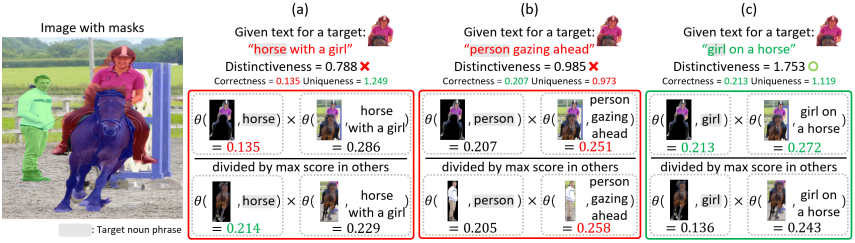

Distinctiveness score 측정을 위해 masked image를 만듭니다.

In [124]:
# Distinctiveness Score 계산을 위한 masked cropped 이미지 생성
masked_cropped_imgs = []
final_boxes = masks_to_boxes(final_masks)
masked_imgs = coca_image * final_masks[:, None, :, :].float() + (1. - final_masks[:, None, :, :].float()) * mean

for i, (m, b) in enumerate(zip(final_masks, final_boxes)):
    # 마스크 영역을 기준으로 이미지 자르기
    x_min, y_min, x_max, y_max = [_.item() for _ in b]
    w, h = (x_max - x_min), (y_max - y_min)
    x_margin, y_margin = (w - (x_max - x_min)) / 2, (h - (y_max - y_min)) / 2
    x_min, y_min, x_max, y_max = max(0, x_min - x_margin), max(0, y_min - y_margin), min(image_w, x_max + x_margin), min(image_h, y_max + y_margin)
    masked_cropped_img = TF.crop(masked_imgs[i], int(y_min), int(x_min), int(h), int(w)).unsqueeze(0)
    
    # 잘린 이미지 padding
    max_wh = int(max(w, h))
    pad_left = (max_wh - masked_cropped_img.shape[3]) // 2
    pad_top = (max_wh - masked_cropped_img.shape[2]) // 2
    pad_right = max_wh - masked_cropped_img.shape[3] - pad_left
    pad_bottom = max_wh - masked_cropped_img.shape[2] - pad_top
    padded_img = TF.pad(masked_cropped_img, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    dummy_image = torch.ones((masked_cropped_img.shape)).to(device="cuda")
    padded_dummy = TF.pad(dummy_image, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    padded_img = padded_img + (1 - padded_dummy) * 0.48145466
    
    # padding된 이미지를 224x224로 크기 변경
    resized_img = TF.resize(padded_img, (224, 224), antialias=True)
    masked_cropped_imgs.append(resized_img)

masked_cropped_imgs = torch.cat(masked_cropped_imgs, dim=0).to(device="cuda") # [N, 3, 224, 224]


In [125]:
import clip
import spacy

# CLIP 모델 불러오기
clip_model_name = 'RN50'
clip_model, _ = clip.load(clip_model_name, device="cuda")

# SpaCy에서 Dependency Parser 불러오기
nlp_parser = spacy.load("en_core_web_lg")

### Distinctiveness Scores 계산하기

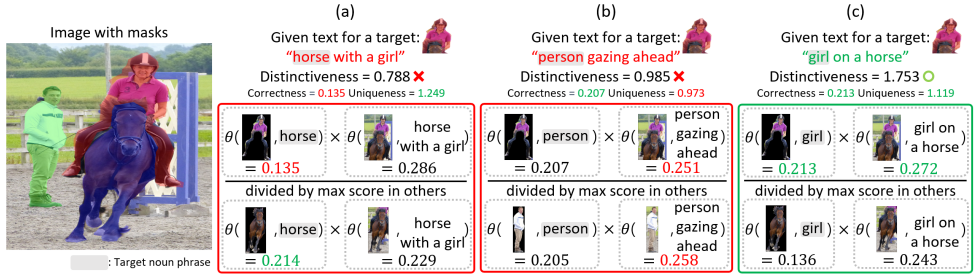

Distinctiveness Score를 계산 후, 사전에 정의한 임계값으로 Pseudo caption을 필터링 합니다.

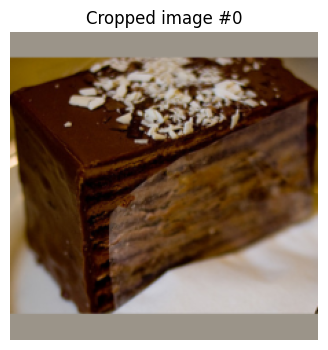

[0] log cake is baked , every side views !  - Distinctiveness: 3.8242
[1] chocolate layer square cake topped coconut  - Distinctiveness: 2.4434
[2] chocolate mud cake from a recipe i used  - Distinctiveness: 2.3438
[3] chocolate mud cake , by business on photo sharing .  - Distinctiveness: 2.2441
[4] chocolate cake from the cruise  - Distinctiveness: 2.2148
[5] chocolate cake from the cruise ship  - Distinctiveness: 2.2090
[6] chocolate mud cake at the hotel  - Distinctiveness: 2.1172
[7] chocolate cake at a party  - Distinctiveness: 2.0410
[8] chocolate mousse cake is one of many recipes that can also make for an amazing treat for a christmas gift !  - Distinctiveness: 1.9443
[9] recipe of the week - gluten free mud cake  - Distinctiveness: 1.4785


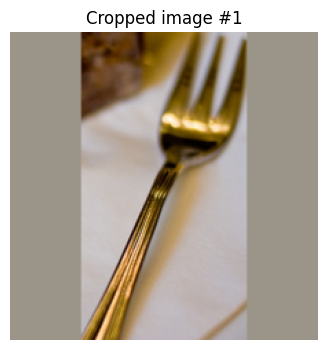

[0] fork with shiny fork in gold on a paper white dinner table setting  - Distinctiveness: 6.5703
[1] fork with gold detail . a golden fork is an everyday metal piece in any setting and any other style that 's always going well at an antique -  - Distinctiveness: 5.5469
[2] gold dinner forks photographed during a wedding .  - Distinctiveness: 3.5840
[3] gold cutlery at our reception for the bride to wear  - Distinctiveness: 3.5469
[4] gold cutlery on a white napkin  - Distinctiveness: 3.3867
[5] gold forks set for breakfast on an empty table with napkin , copy space  - Distinctiveness: 3.3535
[6] gold cutlery for a wedding  - Distinctiveness: 3.2930
[7] cutlery , fork on a white napkin  - Distinctiveness: 3.2559
[8] gold forks at a vintage wedding reception in hotel , by wedding photographer  - Distinctiveness: 3.2559
[9] gold fork at the dinner  - Distinctiveness: 2.9062


In [126]:
from my_utils.noun_extraction import noun_extraction


distinctiveness_scores = []

for idx in range(len(pseudo_captions)):
    noun = [noun_extraction(caption, nlp_parser) for caption in pseudo_captions[idx]]
    noun = ['a photo of a ' + n if n.split()[0] not in ['a', 'an', 'the'] else 'a photo of ' + n for n in noun]
    
    tokenized_caption = clip.tokenize(pseudo_captions[idx], truncate=True).to(device="cuda")  # CLIP 모델에 입력할 캡션 토큰화
    tokenized_noun = clip.tokenize(noun, truncate=True).to(device="cuda")  # CLIP 모델에 입력할 명사 토큰화
    
    with torch.no_grad():
        masked_clip_scores = clip_model(masked_cropped_imgs, tokenized_noun)[0] # masked 이미지와 타겟 명사 간의 유사도 계산
        cropped_clip_scores = clip_model(cropped_imgs, tokenized_caption)[0] # 잘린 이미지와 캡션 간의 유사도 계산
    
    masked_target_score = masked_clip_scores[idx]
    cropped_target_score = cropped_clip_scores[idx]
    target_score = masked_target_score * cropped_target_score

    masked_other_score = masked_clip_scores[torch.arange(masked_clip_scores.shape[0]) != idx]
    cropped_other_score = cropped_clip_scores[torch.arange(cropped_clip_scores.shape[0]) != idx]
    max_masked_other_score = torch.max(masked_other_score, dim=0)[0].unsqueeze(0)  # masked 이미지 중 최대 유사도
    other_score = masked_other_score * cropped_other_score
    max_other_score = torch.max(other_score, dim=0)[0].unsqueeze(0)

    distinctiveness = target_score / max_other_score

    distinctiveness = distinctiveness.squeeze(0)
    distinctiveness_scores.extend(distinctiveness.cpu().numpy())

    sorted_indices = torch.argsort(distinctiveness, descending=True)  # distinctiveness 점수로 정렬
    pseudo_captions[idx] = [pseudo_captions[idx][i] for i in sorted_indices]  # 캡션을 distinctiveness 점수로 정렬
    distinctiveness_scores = [distinctiveness_scores[i] for i in sorted_indices]  # distinctiveness 점수를 정렬된 순서로 저장


    img_tensor = cropped_imgs[idx:idx+1]  # shape [1,C,H,W]
    vis_img = (img_tensor.cpu() * std.cpu() + mean.cpu()).squeeze(0)  # [C,H,W]
    vis_img = vis_img.permute(1, 2, 0).clamp(0, 1).numpy()            # [H,W,C]

    plt.figure(figsize=(4, 4))
    plt.imshow(vis_img)
    plt.axis('off')
    plt.title(f"Cropped image #{idx}")
    plt.show()

    caps = pseudo_captions[idx]
    for j, cap in enumerate(caps):
        print(f"[{j}] {cap} - Distinctiveness: {distinctiveness_scores[j]:.4f}")

    distinctiveness_scores = []  # 다음 이미지 캡션 생성을 위해 초기화

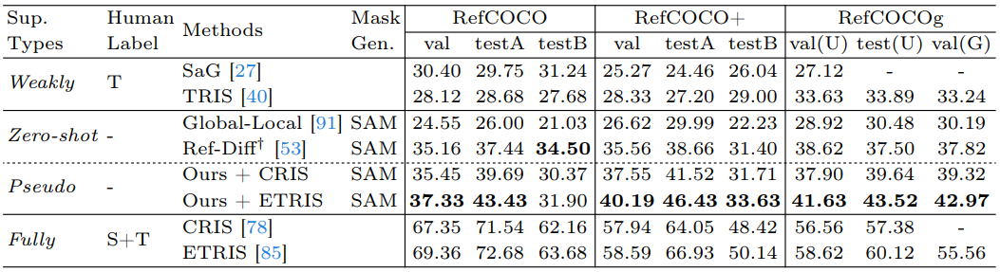

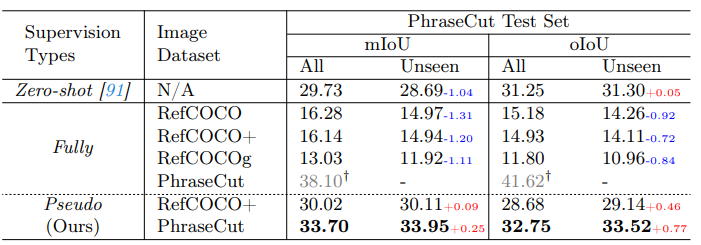

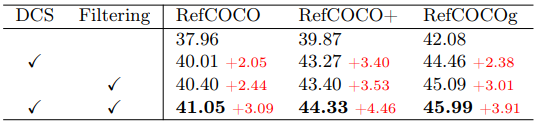


## 다른 예시 이미지

Text(0.5, 1.0, 'Example Image')

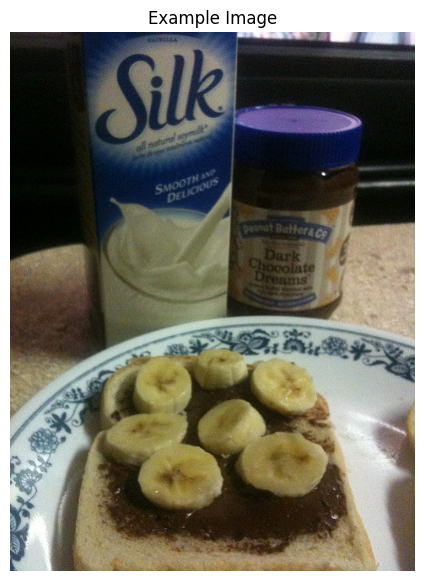

In [127]:
# 예시 이미지 출력
path2dir = './example_images' # 예시 이미지가 저장된 디렉토리
img_name = 'COCO_train2014_000000000142.jpg' # 예시 이미지 파일 이름
path2img = os.path.join(path2dir, img_name) # 예시 이미지의 경로
image = Image.open(path2img) # 예시 이미지 불러오기

# 예시 이미지 출력
plt.figure(figsize=(7, 7))
plt.imshow(image)
plt.axis('off')
plt.title('Example Image')

## 마스크 생성

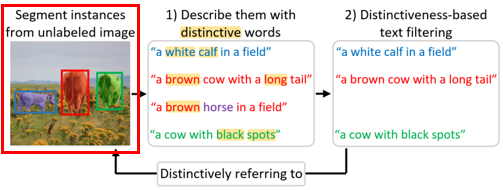

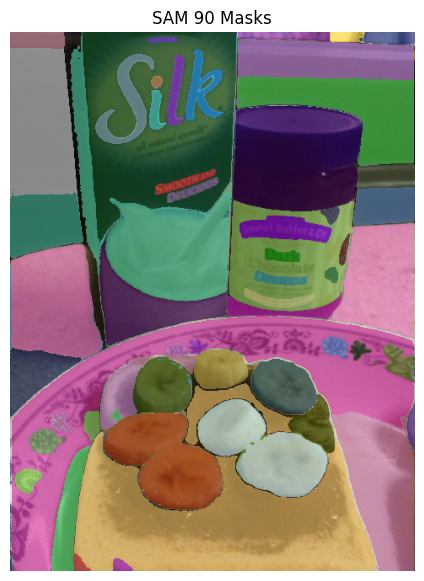

In [128]:
# SAM 마스크 추출 및 시각화
sam_image = cv2.imread(path2img)  # SAM 모델에 입력할 이미지 불러오기
sam_image = cv2.cvtColor(sam_image, cv2.COLOR_BGR2RGB)  # OpenCV는 BGR로 이미지를 읽으므로 RGB로 변환
sam_masks = mask_generator.generate(sam_image)  # SAM 모델을 사용하여 마스크 생성

sam_masks = [torch.tensor(mask['segmentation']) for mask in sam_masks]
sam_masks = torch.stack(sam_masks)
plt.figure(figsize=(7, 7))
plt.imshow(image)  # 원본 이미지 출력
show_masks(sam_masks)
plt.axis('off')
plt.title(f'SAM {len(sam_masks)} Masks')
plt.show()

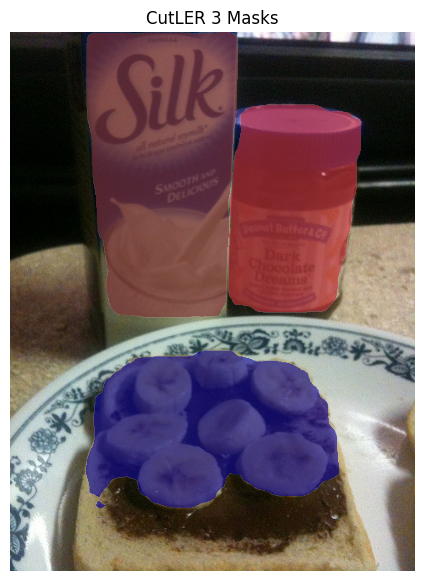

In [129]:
height, width = sam_image.shape[:2]
cutler_image = aug.get_transform(sam_image).apply_image(sam_image) # CutLER 모델에 입력할 이미지 전처리
cutler_image = torch.as_tensor(cutler_image.astype("float32").transpose(2, 0, 1))
cutler_input = {"image": cutler_image, "height": height, "width": width}

with torch.no_grad():
    cutler_output = cutler([cutler_input])[0]  # CutLER 모델에 입력 이미지 전달 및 출력 받기

cutler_masks = cutler_output['instances'].pred_masks

# CutLER 마스크 시각화
plt.figure(figsize=(7, 7))
plt.imshow(image)  # 원본 이미지 출력
show_masks(cutler_masks)
plt.axis('off')
plt.title(f'CutLER {len(cutler_masks)} Masks')
plt.show()


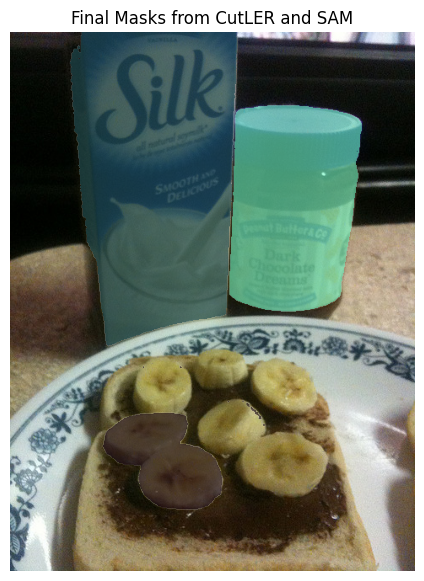

In [130]:
# CutLER 마스크와 중첩된 SAM 마스크 얻기
N_c, H, W = cutler_masks.shape
N_s = sam_masks.shape[0]

inter = cutler_masks.to('cpu').unsqueeze(1) & sam_masks.to('cpu').unsqueeze(0)  # CutLER 마스크와 SAM 마스크의 교집합 계산
overlaps = inter.view(N_c, N_s, -1).sum(dim=2)  # 교집합의 픽셀 수 계산
max_overlaps, max_overlap_idx = overlaps.max(dim=1)  # 각 CutLER 마스크에 대해 가장 큰 SAM 마스크의 교집합 픽셀 수와 인덱스 찾기
final_masks = sam_masks[max_overlap_idx].to("cuda")  # 최종 마스크 선택

# CutLER 마스크와 중첩된 SAM 마스크 시각화
plt.figure(figsize=(7, 7))
plt.imshow(image)  # 원본 이미지 출력
show_masks(final_masks)
plt.axis('off')
plt.title(f'Final Masks from CutLER and SAM')
plt.show()

## 텍스트 생성

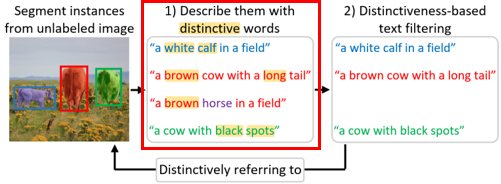

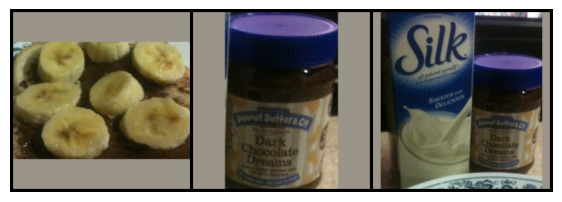

In [131]:
# CoCa 모델에 입력할 이미지 전처리
mean = torch.tensor([0.48145466, 0.4578275,0.40821073], device='cuda').reshape(1, 3, 1, 1)
std = torch.tensor([0.26862954, 0.26130258,0.27577711], device='cuda').reshape(1, 3, 1, 1)
coca_image = torch.from_numpy(sam_image.transpose(2, 0, 1).copy()).to(device="cuda").unsqueeze(0).float()
coca_image.div_(255.0).sub_(mean).div_(std)  # 이미지 정규화
image_h, image_w = coca_image.shape[2:]


# Cropped 이미지 생성
final_boxes = masks_to_boxes(final_masks)
cropped_imgs = []

for i, (m, b) in enumerate(zip(final_masks, final_boxes)):
    # 마스크 영역을 기준으로 이미지 자르기
    x_min, y_min, x_max, y_max = [_.item() for _ in b]
    w, h = (x_max - x_min), (y_max - y_min)
    x_margin, y_margin = (w - (x_max - x_min)) / 2, (h - (y_max - y_min)) / 2
    x_min, y_min, x_max, y_max = max(0, x_min - x_margin), max(0, y_min - y_margin), min(image_w, x_max + x_margin), min(image_h, y_max + y_margin)
    cropped_img = TF.crop(coca_image.squeeze(0), int(y_min), int(x_min), int(h), int(w)).unsqueeze(0)
    
    # 잘린 이미지 padding
    max_wh = int(max(w, h))
    pad_left = (max_wh - cropped_img.shape[3]) // 2
    pad_top = (max_wh - cropped_img.shape[2]) // 2
    pad_right = max_wh - cropped_img.shape[3] - pad_left
    pad_bottom = max_wh - cropped_img.shape[2] - pad_top
    padded_img = TF.pad(cropped_img, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    dummy_image = torch.ones((cropped_img.shape)).to(device="cuda")
    padded_dummy = TF.pad(dummy_image, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    padded_img = padded_img + (1 - padded_dummy) * 0.48145466
    
    # padding된 이미지를 224x224로 크기 변경
    resized_img = TF.resize(padded_img, (224, 224), antialias=True)
    cropped_imgs.append(resized_img)

cropped_imgs = torch.cat(cropped_imgs, dim=0).to(device="cuda") # [N, 3, 224, 224]

# 잘린 이미지 시각화
vis_cropped_imgs = cropped_imgs.cpu() * std.cpu() + mean.cpu()  # 정규화된 이미지 복원
grid = vutils.make_grid(vis_cropped_imgs, nrow=8, padding=4)
grid = grid.numpy().transpose((1, 2, 0))

plt.figure(figsize=(7, 7))
plt.imshow(grid)
plt.axis('off')
plt.show()

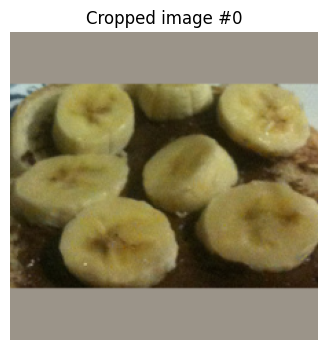

[0] bananas on toast with honey on top and a bite taken out 
[1] bananas fried over toast . 
[2] toast bananas on toast , just the toast 
[3] the bananas with the toast and honey being placed 
[4] toast bananas first , top the slices with maple . 
[5] a breakfast with bananas and toast 
[6] toast the bananas and bananas are toasting . 
[7] toast the bananas in a baking dish 
[8] slices of toast topped with banana slices on a plate 
[9] grilled bananas in bread . 


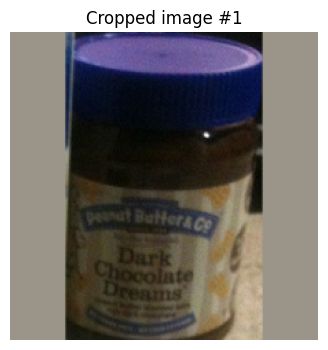

[0] dark dreams peanut by business 
[1] dark dream peanut buter & company , chocolate dreams peanut spread in jar ! 
[2] dark dream peanut buter & company chocolate dream jar : it looks great in your peanut buttery jar . 
[3] peanut : if a girl can dream its lives to see if it would take this jar to be taken back by the teacher ! :) 
[4] peanut butter - we bought one from grocery business . 
[5] dark chocolate dreams peanut butter - product 
[6] dark chocolate dreams peanut butter is a little hard to taste . 
[7] peanut butter for a dark chocolate dreams 
[8] dark chocolate dreams peanut butter i bought . 
[9] jar of peanut butter for use at any moment 


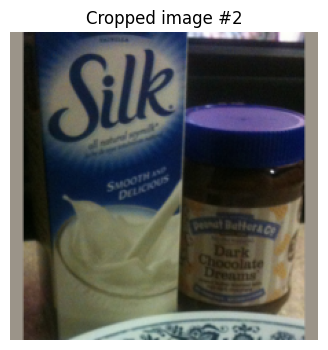

[0] silk smooth cream for chocolate mousse - the ingredients 
[1] silk cream and dark chocolates cream together for the ultimate ice creamy dessert ! and a secret ingredient . 
[2] silk smooth and delicious smooth & smooth cream ... this cream will help with weight gain ! i think this stuff looks great , i 'll be trying it 
[3] silk smooth and delicious smooth smooth smooth and delicate smooth cream ! 
[4] milk and coffee together with milk ! 
[5] silk smooth and delicious , dark chocolate dreams , ingredients for the cream 
[6] smooth and delicious ice cream made with silk chocolate . 
[7] silk smooth and delicious greek yogurt . 
[8] coconut and silky smooth smooth silk smooth & delicious by cream cheese chocolate dip ! 
[9] had cream from silk but used cookie . 


In [132]:
### Text Generation 설정
pseudo_captions = defaultdict(list)  # 생성된 텍스트를 저장할 딕셔너리
sot_token_id = 49406  # SOT (Start of Text) 토큰 ID
eos_token_id = 49407  # EOS (End of Text) 토큰 ID
pad_token_id = 0  # PAD (Padding) 토큰 ID
max_seq_len = 77
num_images = cropped_imgs.shape[0]  # 잘린 이미지의 개수

top_k = [5, 7, 9, 11, 13] # top-k 샘플링을 위한 k 값
top_p = [0.4, 0.5, 0.6, 0.7, 0.8] # top-p 샘플링을 위한 확률 임계값
logit_warpper = DependentTotalLogitsWarper(top_k, top_p, num_images)
top_k_p_len = len(top_k) + len(top_p)

logit_processor = LogitsProcessorList(
    [
        MinLengthLogitsProcessor(5, eos_token_id),  # 최소 길이 5로 설정
        RepetitionPenaltyLogitsProcessor(1.0),  # 반복 패널티 1.0
    ]
)
stopping_criteria = StoppingCriteriaList([MaxLengthCriteria(max_length=30)])  # 최대 길이 30으로 설정

image_latent, image_embs = coca._encode_image(cropped_imgs) # CoCa 모델을 사용하여 이미지 인코딩
similarity_matrix = torch.mm(image_latent, image_latent.T) # 이미지 잠재 벡터 간의 유사도 행렬 계산
repeated_image_embs = image_embs.repeat(top_k_p_len, 1, 1) # top-k와 top-p의 개수만큼 이미지 임베딩 반복

text = torch.ones((image_latent.shape[0] * top_k_p_len, 1), dtype=torch.long, device="cuda") * sot_token_id  # SOT 토큰으로 초기화

cur_len = text.shape[1]  # 현재 텍스트 길이
out = text

with torch.no_grad():
    while True:
        # 매 이터레이션 마다 이전까지 생성된 문장을 보고 next word 샘플링
        # 종료 조건 만족시 종료
        mask = (out[:, -1] == eos_token_id) | (out[:, -1] == pad_token_id)  # 종료된 캡션 확인
        mask = mask.to(torch.bool)
        x = out[~mask, -max_seq_len:] # 종료된 캡션 제외
        cur_len = x.shape[1]  # 현재 텍스트 길이 업데이트
        text_latent, token_embs = coca._encode_text(x, embed_cls=False) # 텍스트 인코딩
        target_logits = coca.text_decoder(repeated_image_embs[~mask], token_embs)[:, -1]
        sample = torch.ones((out.shape[0], 1), device="cuda", dtype=torch.long) * pad_token_id  # 샘플링을 위한 초기화
        
        if mask.all(): # 모든 캡션이 생성 완료된 경우 종료
            break
        else:
            target_logits = logit_processor(x, target_logits) # 최소 길이, 반복 패널티 적용
            target_logits, indices_to_remove_list = logit_warpper(x, target_logits, mask) # top-p, top-k 샘플링 적용

        target_probs = F.softmax(target_logits, dim=-1)  # 확률 계산
        target_probs_eot = target_probs[:, eos_token_id]  # EOS 토큰 확률
        original_probs = target_probs.clone()  # 원본 확률 복사
        
        non_zero_idx = torch.nonzero(~mask, as_tuple=True)[0] % num_images # 종료되지 않은 캡션의 인덱스
        distinctive_image_embs = [image_embs[torch.arange(num_images) != int(idx)] for idx in non_zero_idx]  # 종료되지 않은 캡션의 이미지 임베딩
        distinctive_image_embs = torch.cat(distinctive_image_embs, dim=0)  # 리스트를 텐서로 변환
        distinctive_sim = [similarity_matrix[torch.arange(num_images) == int(idx), torch.arange(num_images) != int(idx)] for idx in non_zero_idx]  # 종료되지 않은 캡션의 이미지 임베딩
        distinctive_sim = torch.stack(distinctive_sim, dim=0) # 리스트를 텐서로 변환
        
        distinctive_token_embs = torch.cat([embs.repeat(num_images-1, 1, 1) for embs in token_embs]) # 타켓 이미지에 대해 생성된 문장의 토큰 임베딩
        distinctive_logits = coca.text_decoder(
            distinctive_image_embs, distinctive_token_embs
        )[:, -1]  # 타겟 이미지에 대해 생성된 문장과 다른 이미지를 보고 다음 단어 옟측
        distinctive_logits = distinctive_logits.view(-1, num_images-1, 49408)  # logits를 (batch_size, num_images-1, vocab_size) 형태로 변환
        distinctive_logits = distinctive_logits.mul_(distinctive_sim.unsqueeze(-1))  # 유사도 행렬을 logits에 곱하여 가중치 적용
        distinctive_logits = torch.mean(distinctive_logits, dim=1)  # 이미지 간의 평균 logits 계산
        
        target_logits = target_logits - distinctive_logits  # 타겟 logits에서 다른 이미지의 logits를 빼기

        target_logits = target_logits.masked_fill(indices_to_remove_list, -float('inf'))  # Top-k, top-p 샘플링을 위한 마스킹 적용
        target_probs = F.softmax(target_logits, dim=-1)  # softmax를 적용하여 확률 계산
        target_probs[:, eos_token_id] = target_probs_eot  # EOS 토큰 확률을 원래 확률로 설정
        
        if (cur_len + 1 == max_seq_len): # 현재 길이가 최대 길이와 같으면 EOS 토큰으로 설정
            sample[~mask, :] = torch.ones((sum(~mask), 1), device="cuda", dtype=torch.long) * eos_token_id
        else:
            sample[~mask, :] = torch.multinomial(target_probs, num_samples=1) # 샘플링하여 다음 토큰 선택
        out = torch.cat((out,sample), dim=1)  # 현재 텍스트에 샘플링된 토큰 추가
        
        cur_len += 1  # 현재 텍스트 길이 업데이트
        
        if stopping_criteria(out, None):
            break

for idx in range(out.shape[0]):
    pseudo_caption = open_clip.decode(out[idx]).split("<end_of_text>")[0].replace("<start_of_text>", "")  # EOS 토큰 제거
    pseudo_captions[idx % num_images].append(pseudo_caption)  # 캡션을 딕셔너리에 저장
    
for idx in range(len(pseudo_captions)):
    img_tensor = cropped_imgs[idx:idx+1]  # shape [1,C,H,W]
    vis_img = (img_tensor.cpu() * std.cpu() + mean.cpu()).squeeze(0)  # [C,H,W]
    vis_img = vis_img.permute(1, 2, 0).clamp(0, 1).numpy()            # [H,W,C]

    plt.figure(figsize=(4, 4))
    plt.imshow(vis_img)
    plt.axis('off')
    plt.title(f"Cropped image #{idx}")
    plt.show()

    caps = pseudo_captions[idx]
    for j, cap in enumerate(caps):
        print(f"[{j}] {cap}")


### Distinctiveness Score 측정 및 텍스트 필터링

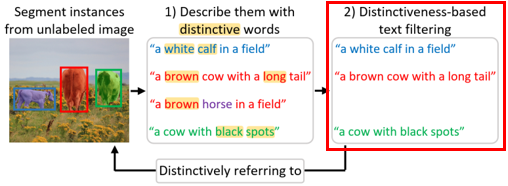

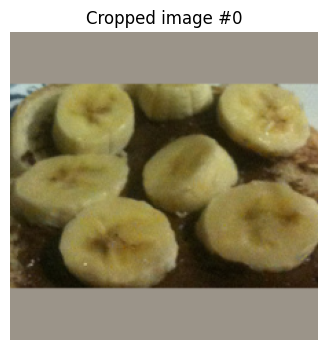

[0] grilled bananas in bread .  - Distinctiveness: 3.3242
[1] slices of toast topped with banana slices on a plate  - Distinctiveness: 3.2852
[2] bananas fried over toast .  - Distinctiveness: 3.0664
[3] bananas on toast with honey on top and a bite taken out  - Distinctiveness: 3.0488
[4] toast the bananas and bananas are toasting .  - Distinctiveness: 2.9043
[5] toast bananas on toast , just the toast  - Distinctiveness: 2.8945
[6] toast bananas first , top the slices with maple .  - Distinctiveness: 2.5566
[7] the bananas with the toast and honey being placed  - Distinctiveness: 2.5254
[8] toast the bananas in a baking dish  - Distinctiveness: 2.2188
[9] a breakfast with bananas and toast  - Distinctiveness: 1.9062


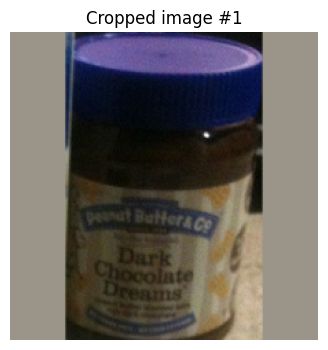

[0] dark dream peanut buter & company chocolate dream jar : it looks great in your peanut buttery jar .  - Distinctiveness: 6.1680
[1] dark dream peanut buter & company , chocolate dreams peanut spread in jar !  - Distinctiveness: 2.2402
[2] dark chocolate dreams peanut butter - product  - Distinctiveness: 1.8428
[3] dark chocolate dreams peanut butter is a little hard to taste .  - Distinctiveness: 1.7080
[4] dark chocolate dreams peanut butter i bought .  - Distinctiveness: 1.6660
[5] jar of peanut butter for use at any moment  - Distinctiveness: 1.6436
[6] dark dreams peanut by business  - Distinctiveness: 1.6084
[7] peanut : if a girl can dream its lives to see if it would take this jar to be taken back by the teacher ! :)  - Distinctiveness: 1.5293
[8] peanut butter - we bought one from grocery business .  - Distinctiveness: 1.4600
[9] peanut butter for a dark chocolate dreams  - Distinctiveness: 1.3740


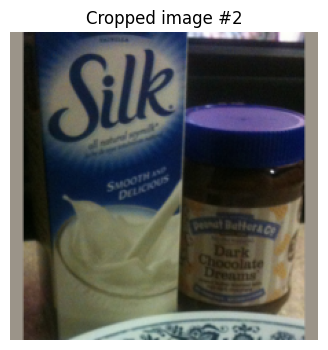

[0] milk and coffee together with milk !  - Distinctiveness: 1.6465
[1] silk smooth and delicious greek yogurt .  - Distinctiveness: 1.4062
[2] silk smooth and delicious , dark chocolate dreams , ingredients for the cream  - Distinctiveness: 1.3564
[3] coconut and silky smooth smooth silk smooth & delicious by cream cheese chocolate dip !  - Distinctiveness: 1.1602
[4] silk smooth and delicious smooth & smooth cream ... this cream will help with weight gain ! i think this stuff looks great , i 'll be trying it  - Distinctiveness: 1.1455
[5] had cream from silk but used cookie .  - Distinctiveness: 1.0859
[6] silk smooth cream for chocolate mousse - the ingredients  - Distinctiveness: 1.0645
[7] silk smooth and delicious smooth smooth smooth and delicate smooth cream !  - Distinctiveness: 0.9917
[8] smooth and delicious ice cream made with silk chocolate .  - Distinctiveness: 0.9521
[9] silk cream and dark chocolates cream together for the ultimate ice creamy dessert ! and a secret ingr

In [133]:
# Distinctiveness Score 계산을 위한 masked cropped 이미지 생성
masked_cropped_imgs = []
final_boxes = masks_to_boxes(final_masks)
masked_imgs = coca_image * final_masks[:, None, :, :].float() + (1. - final_masks[:, None, :, :].float()) * mean

for i, (m, b) in enumerate(zip(final_masks, final_boxes)):
    # 마스크 영역을 기준으로 이미지 자르기
    x_min, y_min, x_max, y_max = [_.item() for _ in b]
    w, h = (x_max - x_min), (y_max - y_min)
    x_margin, y_margin = (w - (x_max - x_min)) / 2, (h - (y_max - y_min)) / 2
    x_min, y_min, x_max, y_max = max(0, x_min - x_margin), max(0, y_min - y_margin), min(image_w, x_max + x_margin), min(image_h, y_max + y_margin)
    masked_cropped_img = TF.crop(masked_imgs[i], int(y_min), int(x_min), int(h), int(w)).unsqueeze(0)
    
    # 잘린 이미지 padding
    max_wh = int(max(w, h))
    pad_left = (max_wh - masked_cropped_img.shape[3]) // 2
    pad_top = (max_wh - masked_cropped_img.shape[2]) // 2
    pad_right = max_wh - masked_cropped_img.shape[3] - pad_left
    pad_bottom = max_wh - masked_cropped_img.shape[2] - pad_top
    padded_img = TF.pad(masked_cropped_img, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    dummy_image = torch.ones((masked_cropped_img.shape)).to(device="cuda")
    padded_dummy = TF.pad(dummy_image, (pad_left, pad_top, pad_right, pad_bottom), padding_mode='constant')
    padded_img = padded_img + (1 - padded_dummy) * 0.48145466
    
    # padding된 이미지를 224x224로 크기 변경
    resized_img = TF.resize(padded_img, (224, 224), antialias=True)
    masked_cropped_imgs.append(resized_img)

masked_cropped_imgs = torch.cat(masked_cropped_imgs, dim=0).to(device="cuda") # [N, 3, 224, 224]


uniqueness_scores = []
correctness_scores = []
distinctiveness_scores = []

for idx in range(len(pseudo_captions)):
    noun = [noun_extraction(caption, nlp_parser) for caption in pseudo_captions[idx]]
    noun = ['a photo of a ' + n if n.split()[0] not in ['a', 'an', 'the'] else 'a photo of ' + n for n in noun]
    
    tokenized_caption = clip.tokenize(pseudo_captions[idx], truncate=True).to(device="cuda")  # CLIP 모델에 입력할 캡션 토큰화
    tokenized_noun = clip.tokenize(noun, truncate=True).to(device="cuda")  # CLIP 모델에 입력할 명사 토큰화
    
    with torch.no_grad():
        masked_clip_scores = clip_model(masked_cropped_imgs, tokenized_noun)[0] # masked 이미지와 타겟 명사 간의 유사도 계산
        cropped_clip_scores = clip_model(cropped_imgs, tokenized_caption)[0] # 잘린 이미지와 캡션 간의 유사도 계산
    
    masked_target_score = masked_clip_scores[idx]
    cropped_target_score = cropped_clip_scores[idx]
    target_score = masked_target_score * cropped_target_score

    masked_other_score = masked_clip_scores[torch.arange(masked_clip_scores.shape[0]) != idx]
    cropped_other_score = cropped_clip_scores[torch.arange(cropped_clip_scores.shape[0]) != idx]
    max_masked_other_score = torch.max(masked_other_score, dim=0)[0].unsqueeze(0)  # masked 이미지 중 최대 유사도
    other_score = masked_other_score * cropped_other_score
    max_other_score = torch.max(other_score, dim=0)[0].unsqueeze(0)

    distinctiveness = target_score / max_other_score

    distinctiveness = distinctiveness.squeeze(0)
    distinctiveness_scores.extend(distinctiveness.cpu().numpy())

    sorted_indices = torch.argsort(distinctiveness, descending=True)  # distinctiveness 점수로 정렬
    pseudo_captions[idx] = [pseudo_captions[idx][i] for i in sorted_indices]  # 캡션을 distinctiveness 점수로 정렬
    distinctiveness_scores = [distinctiveness_scores[i] for i in sorted_indices]  # distinctiveness 점수를 정렬된 순서로 저장


    img_tensor = cropped_imgs[idx:idx+1]  # shape [1,C,H,W]
    vis_img = (img_tensor.cpu() * std.cpu() + mean.cpu()).squeeze(0)  # [C,H,W]
    vis_img = vis_img.permute(1, 2, 0).clamp(0, 1).numpy()            # [H,W,C]

    plt.figure(figsize=(4, 4))
    plt.imshow(vis_img)
    plt.axis('off')
    plt.title(f"Cropped image #{idx}")
    plt.show()

    caps = pseudo_captions[idx]
    for j, cap in enumerate(caps):
        print(f"[{j}] {cap} - Distinctiveness: {distinctiveness_scores[j]:.4f}")

    distinctiveness_scores = []  # 다음 이미지 캡션 생성을 위해 초기화
    